This is your private sketch-notebook. Do whatever you want with it. When code is ready to be developed, please just copy and paste it to the final notebook. 

In [6]:
import sys
kaggle_path = '../../../Data/Kaggle/train/*'
sys.path.append('../../..')
from First_start.imports import *
from First_start.multi_gpu import *
from First_start.init_vars import *
from First_start.start_functions import *
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Get x and y variables
x_train, y_train, x_test, y_test, image_df, dummy_df = get_xy(folders_path=kaggle_path, test_size=0.3,
                                                              img_size=(224, 224), seed=seed)

# Let's check the shape of those variables
print (x_train.shape, y_train.shape, x_test.shape, y_test.shape)

## 1.0 Locating Fish In Image

## 1.1 Training on LAG Fish

(<matplotlib.axes._subplots.AxesSubplot at 0x7fe2adba0b70>,
 <matplotlib.image.AxesImage at 0x7fe2adab55f8>)

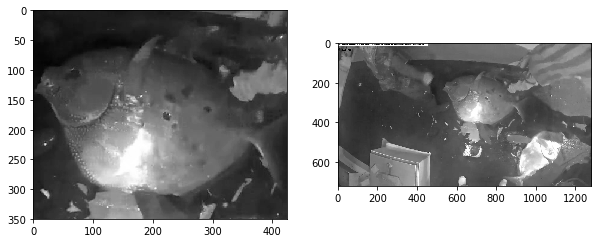

In [7]:
img_rows, img_cols= 350, 425
im_array = cv2.imread('../../../Data/Kaggle/train/LAG/img_00091.jpg',0)
template = np.zeros([ img_rows, img_cols], dtype='uint8') # initialisation of the template
template[:, :] = im_array[100:450,525:950] # I try multiple times to find the correct rectangle. 
#template /= 255.
plt.subplots(figsize=(10, 7))
plt.subplot(121),plt.imshow(template, cmap='gray') 
plt.subplot(122), plt.imshow(im_array, cmap='gray')

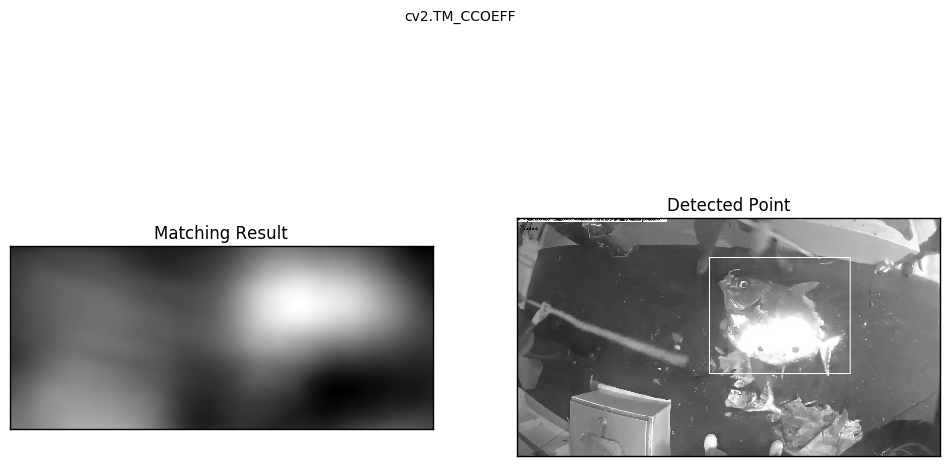

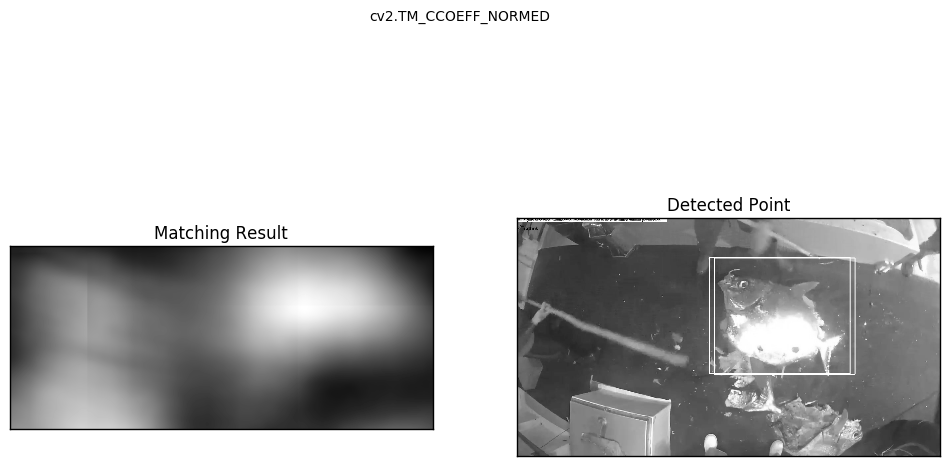

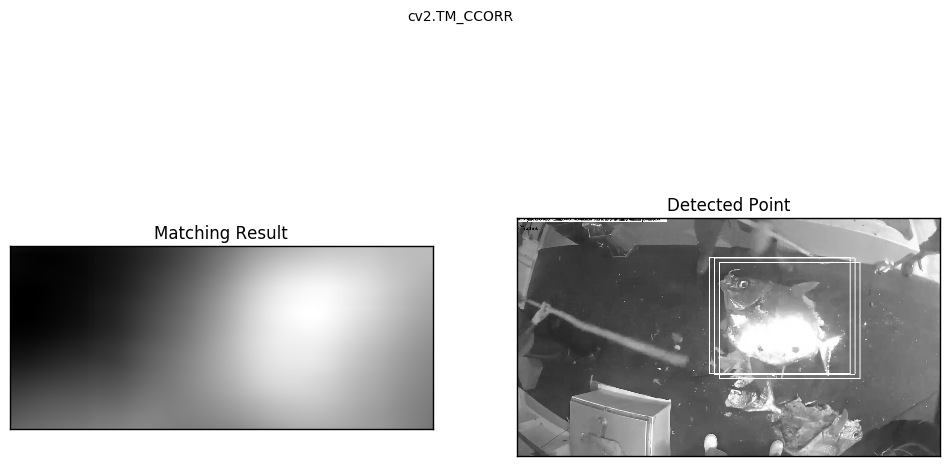

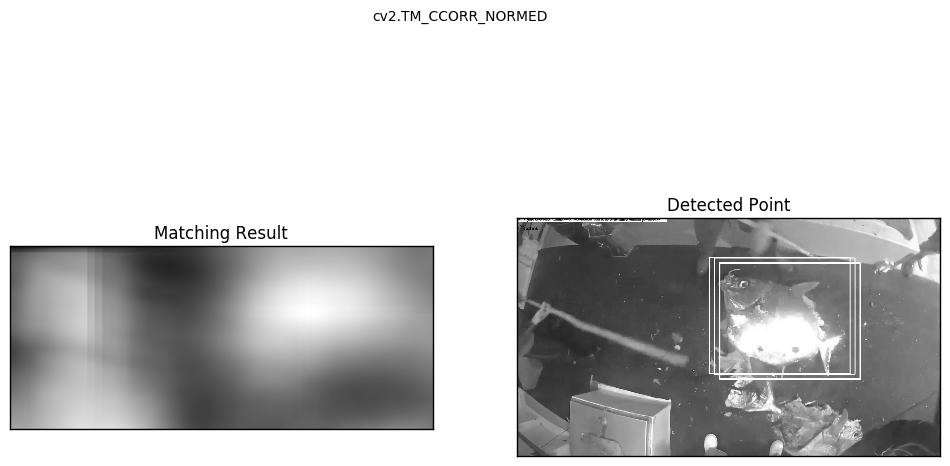

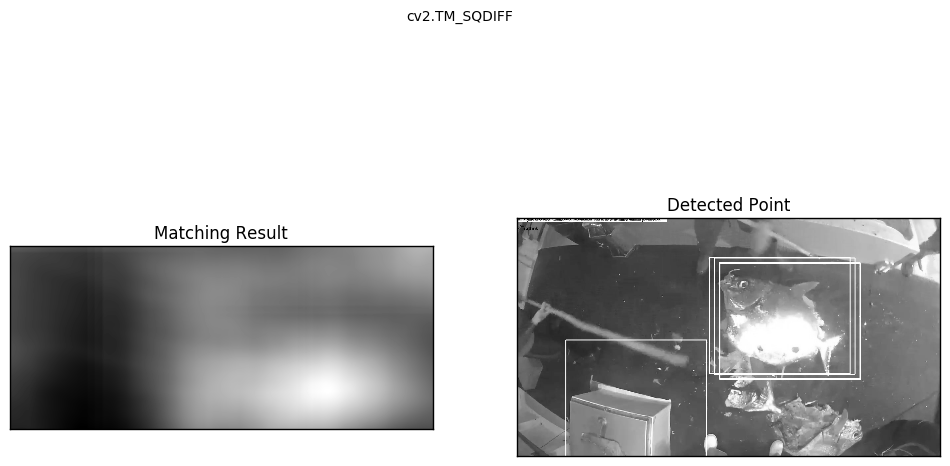

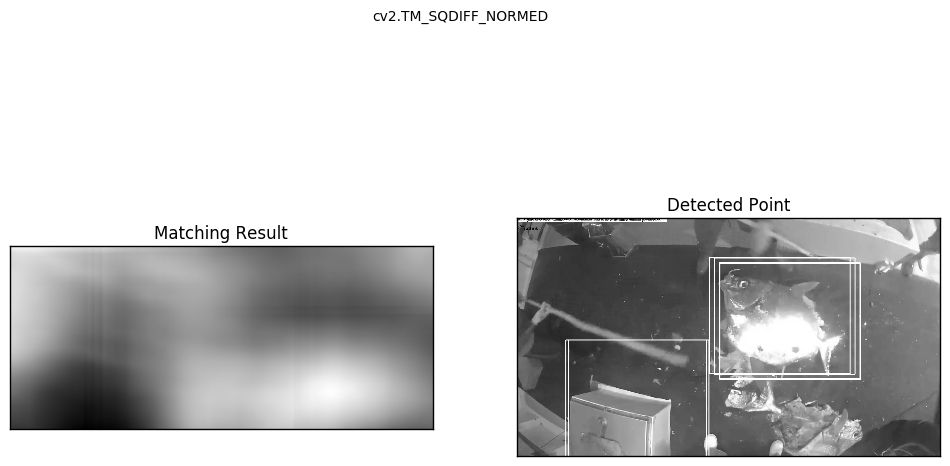

In [9]:
file_name = '../Data/Kaggle/train/LAG/img_01512.jpg' # img_00176,img_02758, img_01512
img = cv2.imread(file_name,0) 
img2 = img
w, h = template.shape[::-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
     img = img2
     method = eval(meth)
 
     # Apply template Matching
     res = cv2.matchTemplate(img,template,method)
     min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
 
     # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
     if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
         top_left = min_loc
     else:
         top_left = max_loc
     bottom_right = (top_left[0] + w, top_left[1] + h)
 
     cv2.rectangle(img,top_left, bottom_right, 255, 2)
     fig, ax = plt.subplots(figsize=(12, 7))
     plt.subplot(121),plt.imshow(res,cmap = 'gray')
     plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
     plt.subplot(122),plt.imshow(img,cmap = 'gray') #,aspect='auto'
     plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
     plt.suptitle(meth)
 
     plt.show()

## 1.2 Train Shark

(<matplotlib.axes._subplots.AxesSubplot at 0x7f77d039bf10>,
 <matplotlib.image.AxesImage at 0x7f77db21b590>)

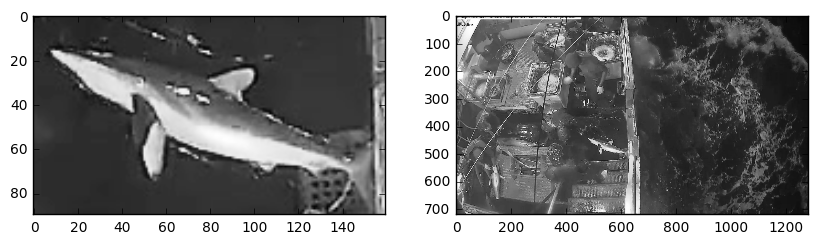

In [10]:
img_rows, img_cols= 90, 160
im_array = cv2.imread('../Data/Kaggle/train/SHARK/img_00033.jpg',0)
template = np.zeros([ img_rows, img_cols], dtype='uint8') # initialisation of the template
template[:, :] = im_array[430:520,470:630] # I try multiple times to find the correct rectangle. 
#template /= 255.
plt.subplots(figsize=(10, 7))
plt.subplot(121),plt.imshow(template, cmap='gray') 
plt.subplot(122), plt.imshow(im_array, cmap='gray')

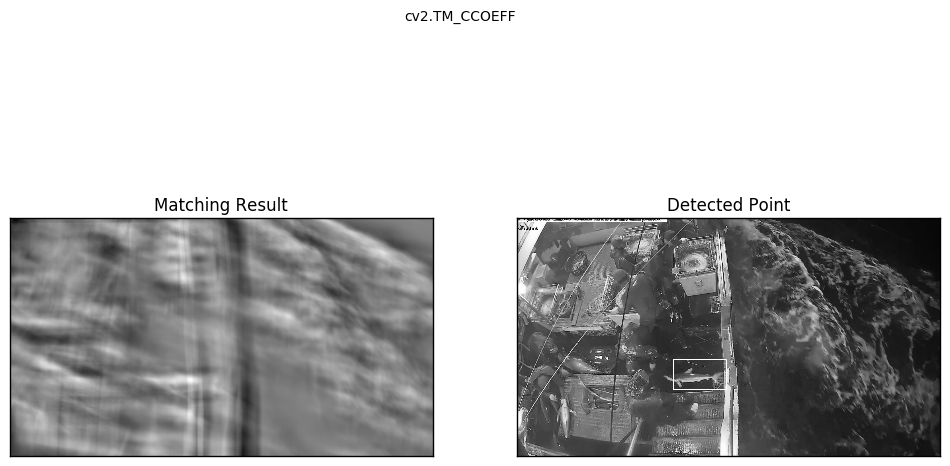

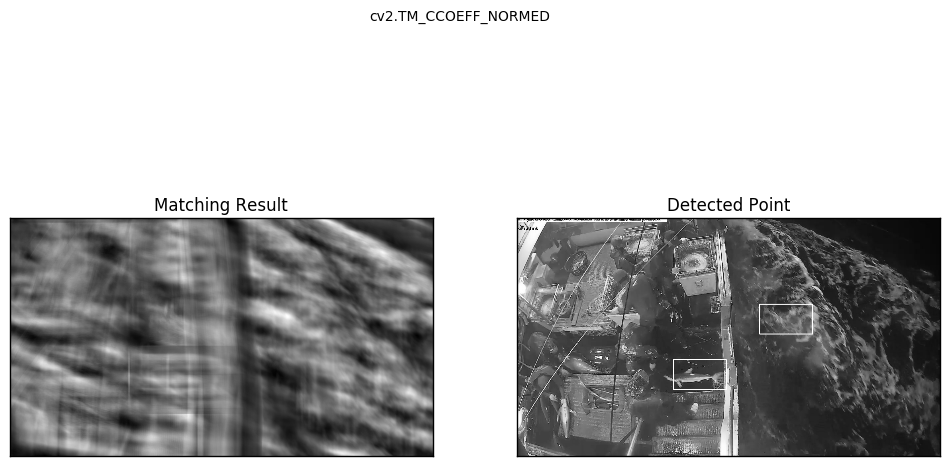

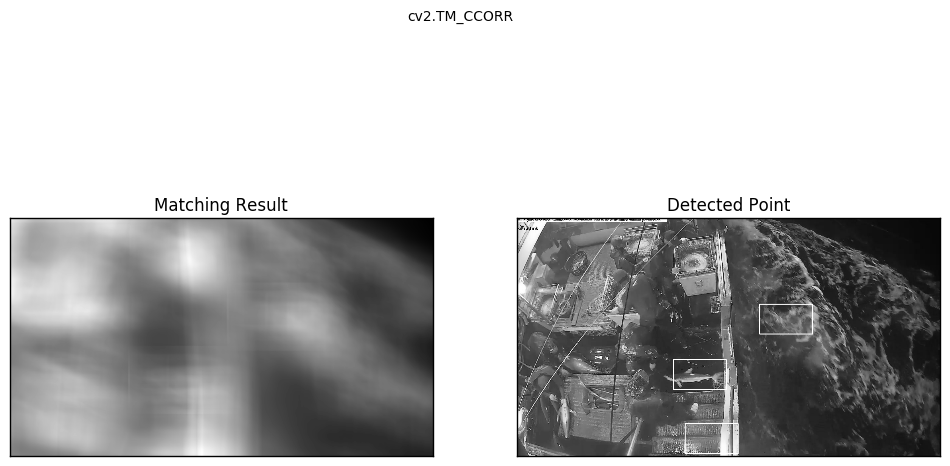

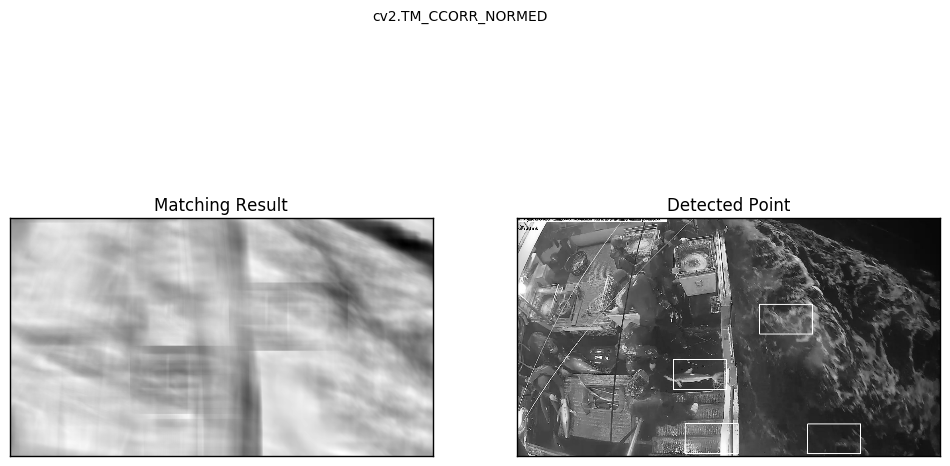

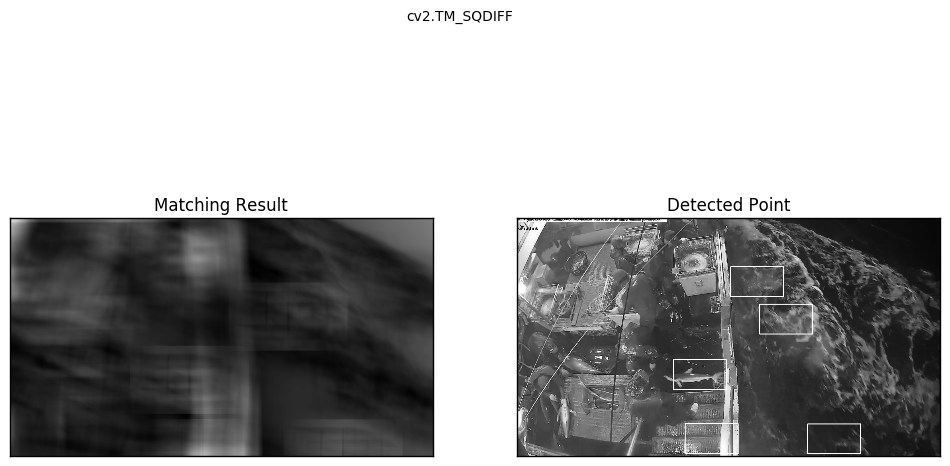

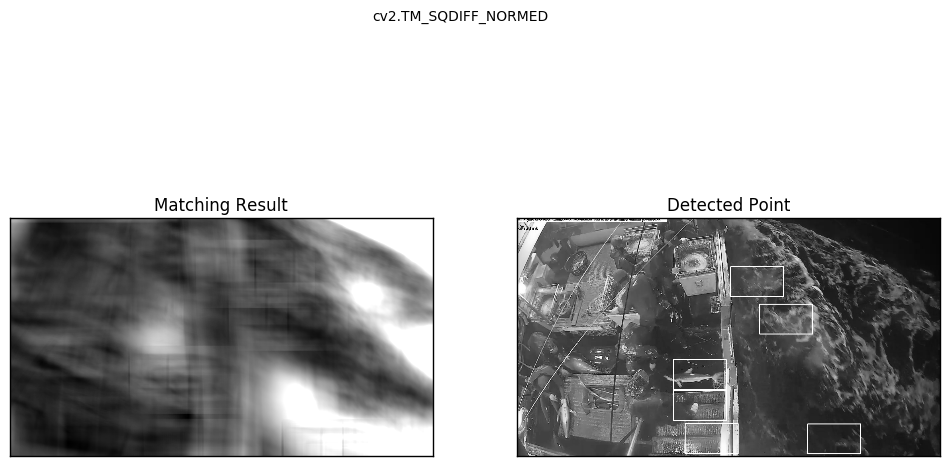

In [11]:
file_name = '../Data/Kaggle/train/SHARK/img_05391.jpg' # img_00176,img_02758, img_01512
img = cv2.imread(file_name,0) 
img2 = img
w, h = template.shape[::-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
     img = img2
     method = eval(meth)
 
     # Apply template Matching
     res = cv2.matchTemplate(img,template,method)
     min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
 
     # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
     if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
         top_left = min_loc
     else:
         top_left = max_loc
     bottom_right = (top_left[0] + w, top_left[1] + h)
 
     cv2.rectangle(img,top_left, bottom_right, 255, 2)
     fig, ax = plt.subplots(figsize=(12, 7))
     plt.subplot(121),plt.imshow(res,cmap = 'gray')
     plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
     plt.subplot(122),plt.imshow(img,cmap = 'gray') #,aspect='auto'
     plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
     plt.suptitle(meth)
 
     plt.show()

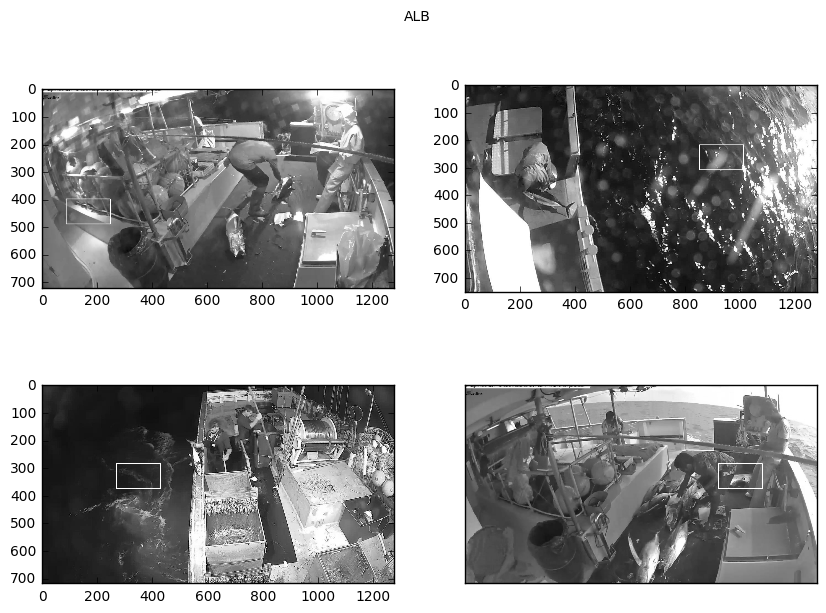

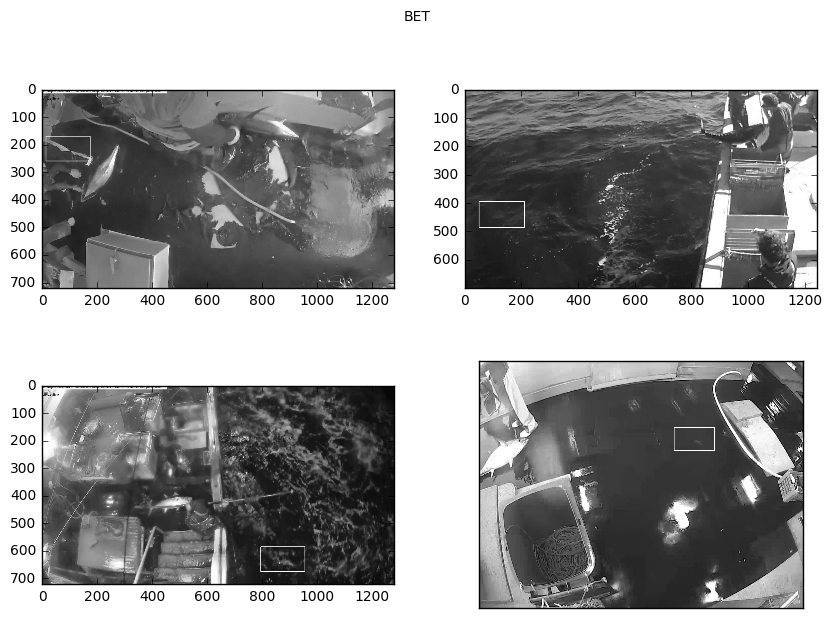

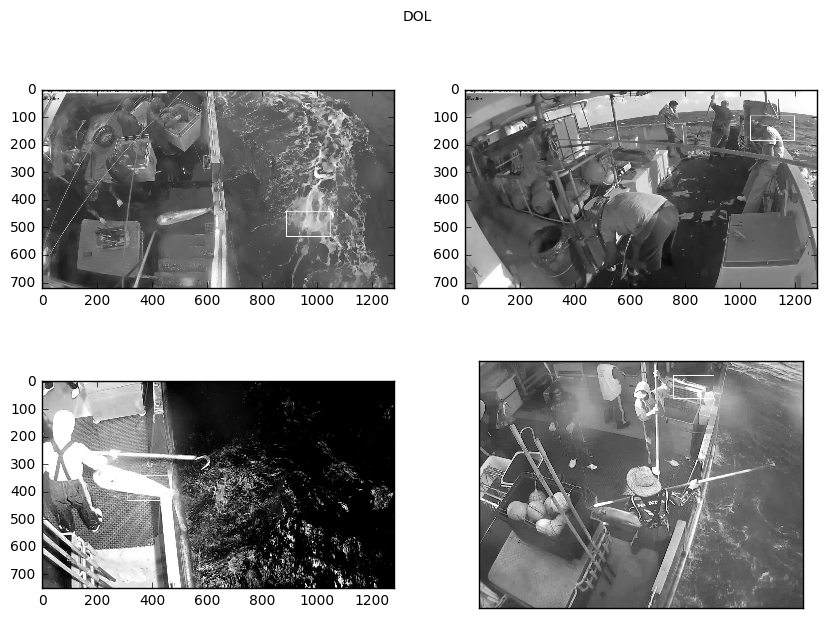

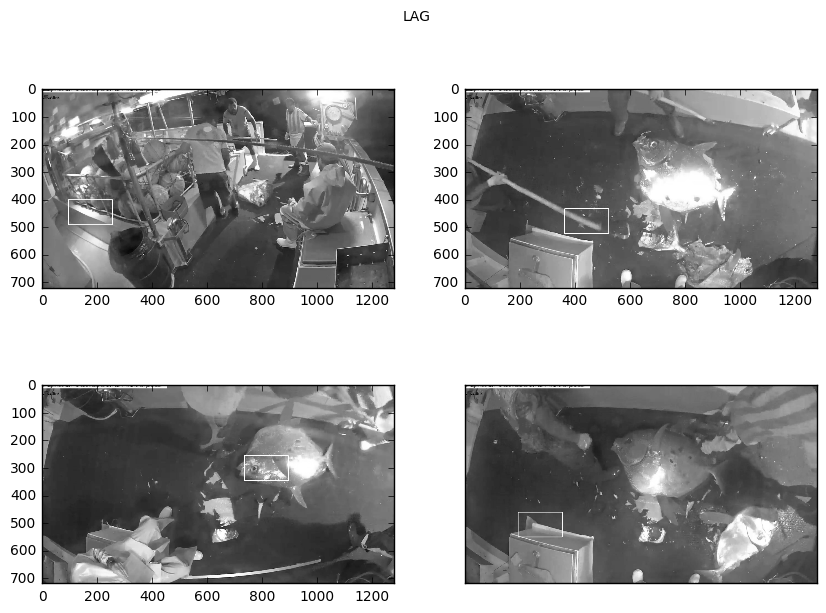

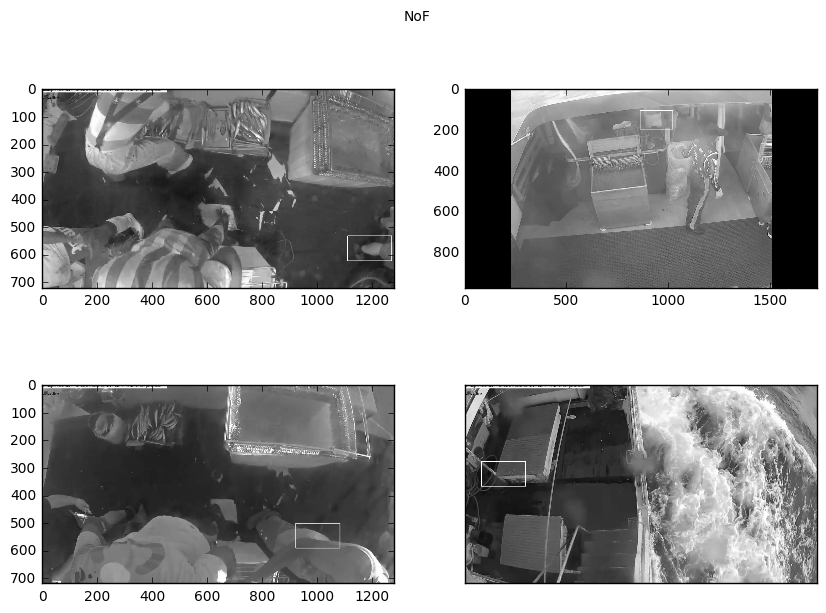

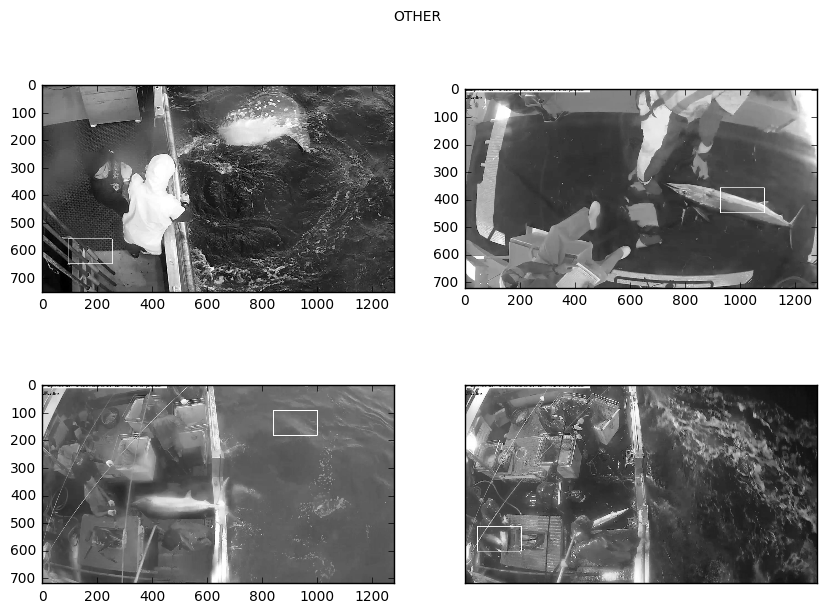

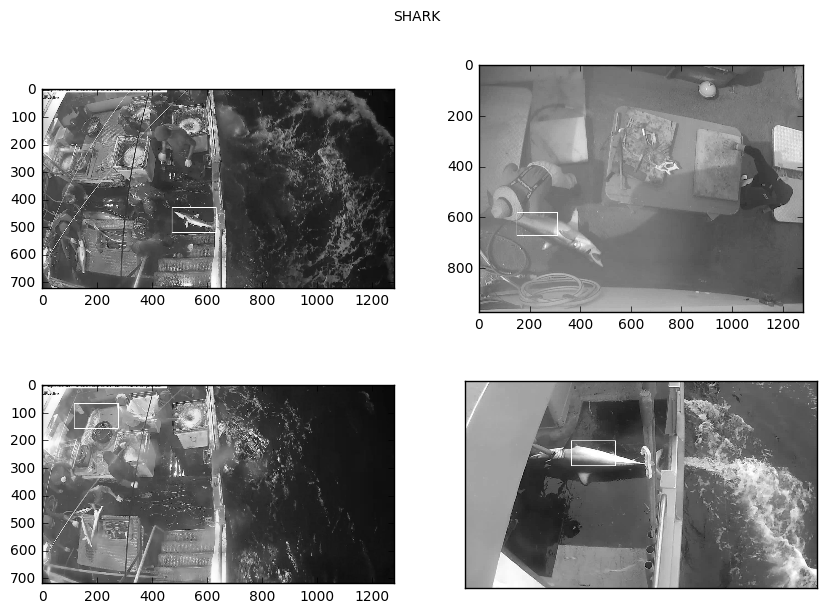

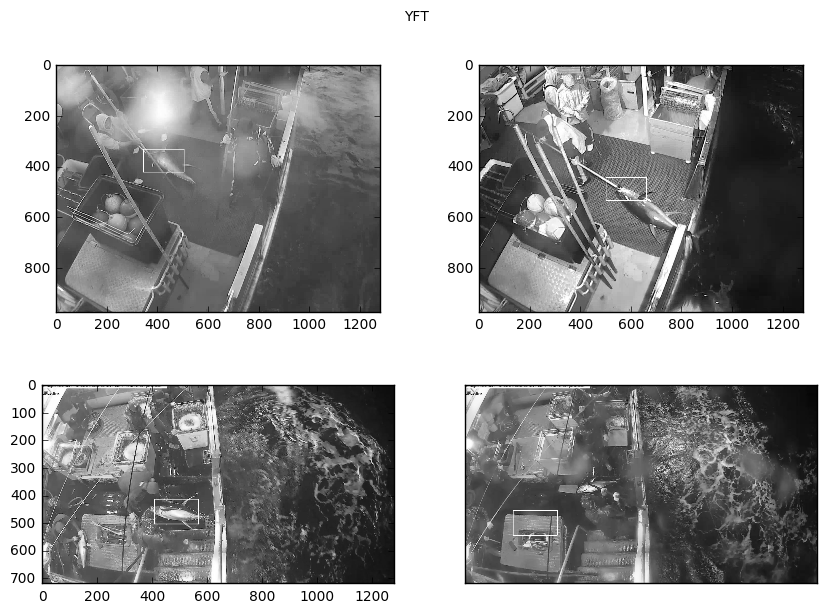

In [12]:
method = eval('cv2.TM_CCOEFF_NORMED')
indexes=[1,30,40,5]

train_path = "../Data/Kaggle/train/"
sub_folders = check_output(["ls", train_path]).decode("utf8").strip().split('\n')
for sub_folder in sub_folders:
    file_names = check_output(["ls", train_path+sub_folder]).decode("utf8").strip().split('\n')
    k=0
    _, ax = plt.subplots(2,2,figsize=(10, 7))
    for file_name in [file_names[x] for x in indexes]: # I take only 4 images of each group. 
        img = cv2.imread(train_path+sub_folder+"/"+file_name,0)
        img2 = img
        w, h = template.shape[::-1]
        # Apply template Matching
        res = cv2.matchTemplate(img,template,method)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
 
        cv2.rectangle(img,top_left, bottom_right, 255, 2)
        if k==0 : 
            ax[0,0].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        if k==1 : 
            ax[0,1].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        if k==2 : 
            ax[1,0].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        if k==3 : 
            ax[1,1].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        k=k+1
    plt.suptitle(sub_folder)
    plt.show()


## 1.2 Train Tuna

(<matplotlib.axes._subplots.AxesSubplot at 0x7f77ca235c10>,
 <matplotlib.image.AxesImage at 0x7f77db20f290>)

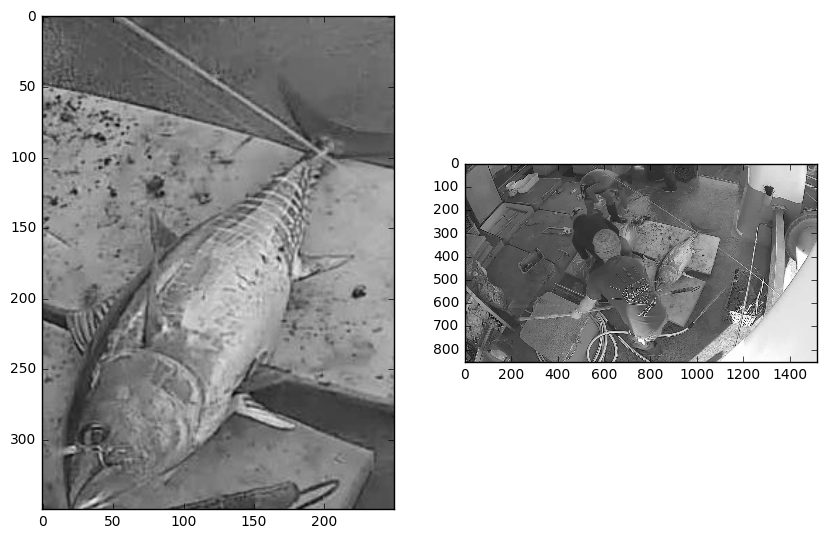

In [13]:
img_rows, img_cols= 350, 250
im_array = cv2.imread('../Data/Kaggle/train/BET/img_00107.jpg',0)

# Needs to scale to different boats
template = np.zeros([ img_rows, img_cols], dtype='uint8') # initialisation of the template
template[:, :] = im_array[200:550,800:1050] # I try multiple times to find the correct rectangle. 

#template /= 255.
plt.subplots(figsize=(10, 7))
plt.subplot(121),plt.imshow(template, cmap='gray') 
plt.subplot(122), plt.imshow(im_array, cmap='gray')

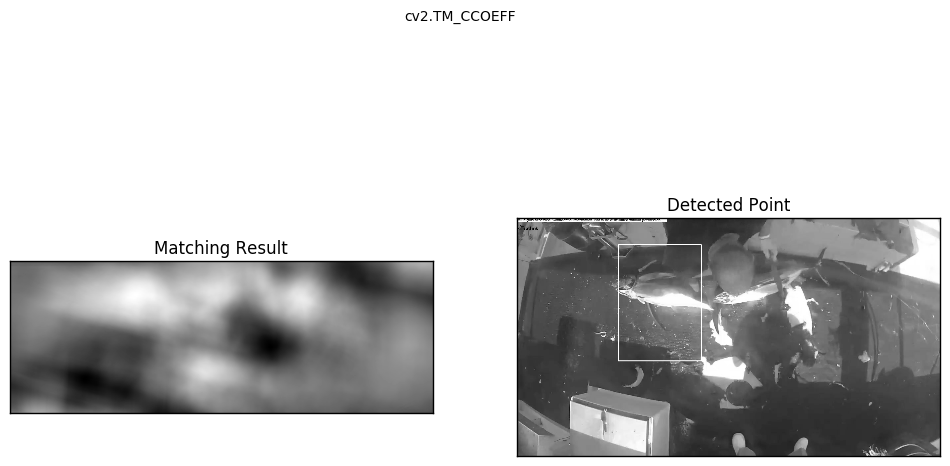

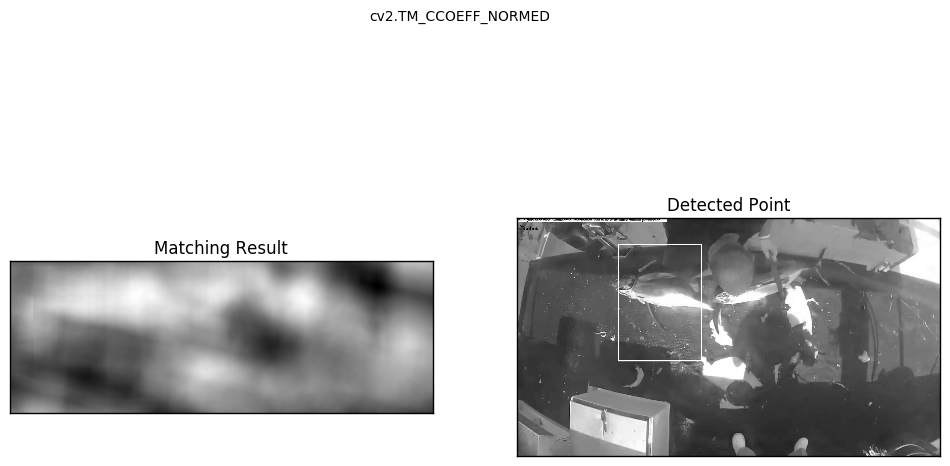

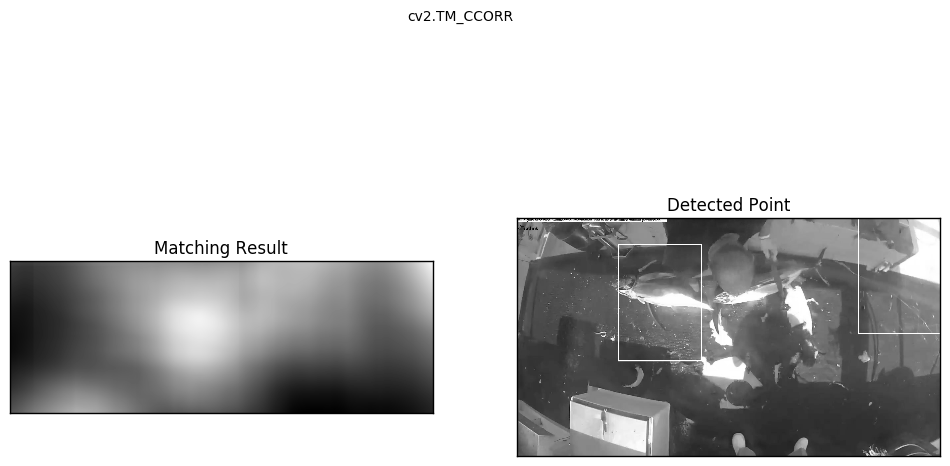

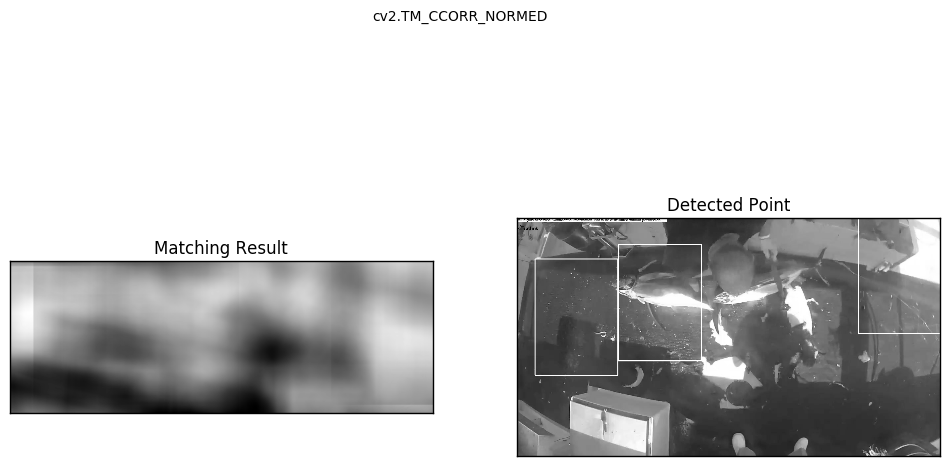

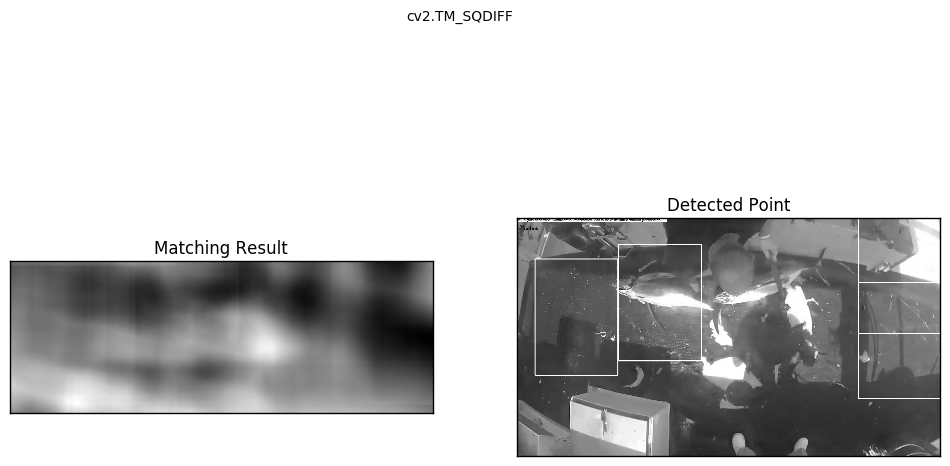

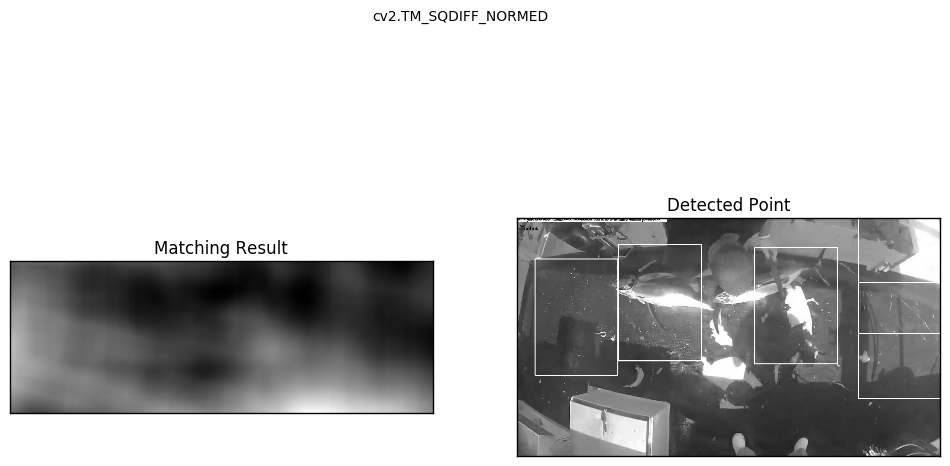

In [14]:
file_name = '../Data/Kaggle/train/BET/img_00225.jpg' # img_00176,img_02758, img_01512
img = cv2.imread(file_name,0) 
img2 = img
w, h = template.shape[::-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2
    method = eval(meth)
 
     # Apply template Matching
    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
 
     # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
 
    cv2.rectangle(img,top_left, bottom_right, 255, 2)
    fig, ax = plt.subplots(figsize=(12, 7))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray') #,aspect='auto'
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
 
    plt.show()

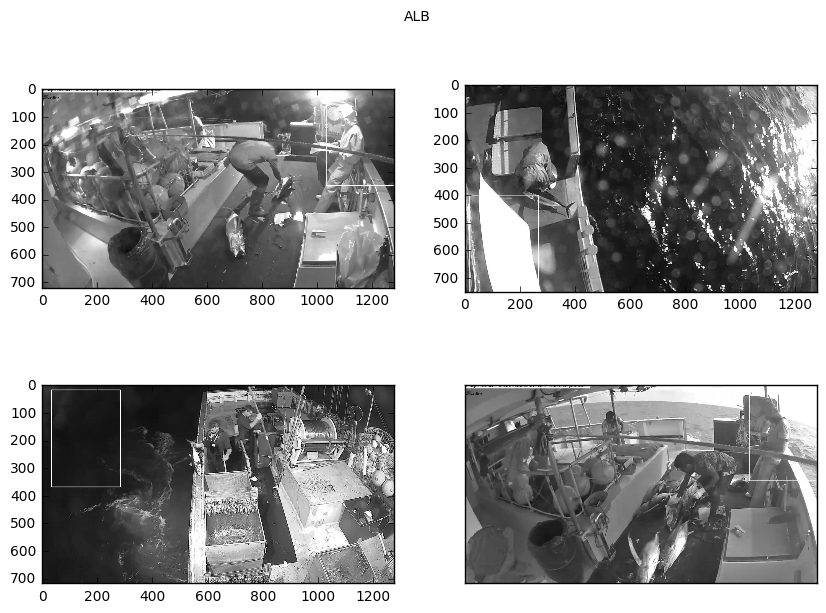

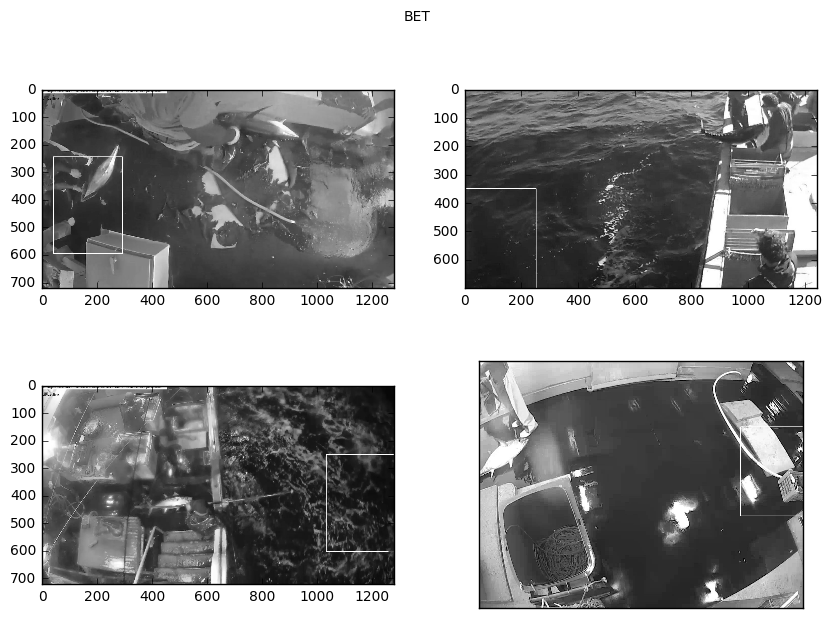

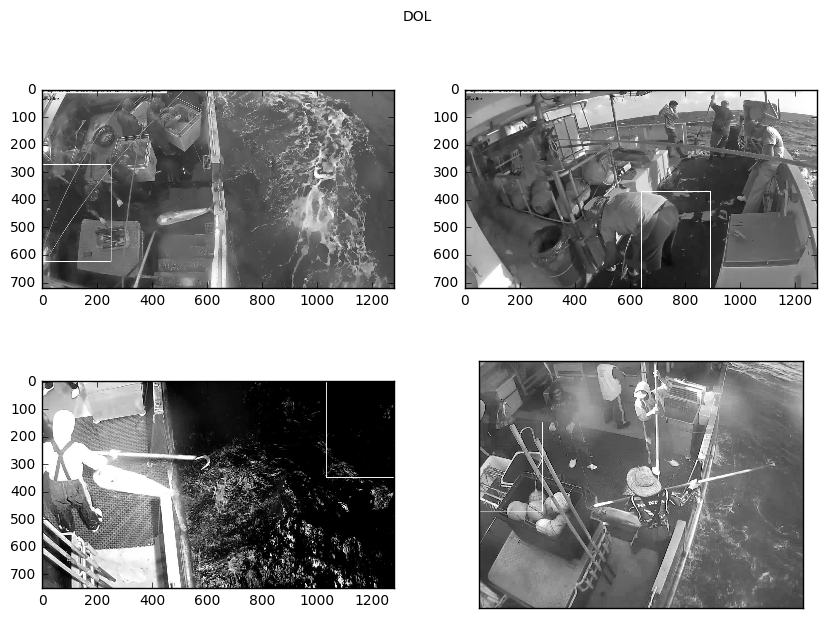

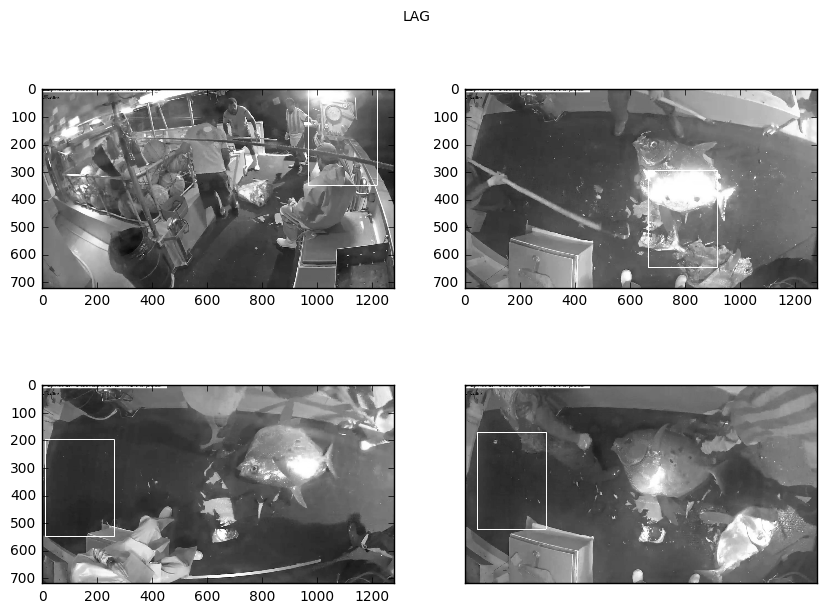

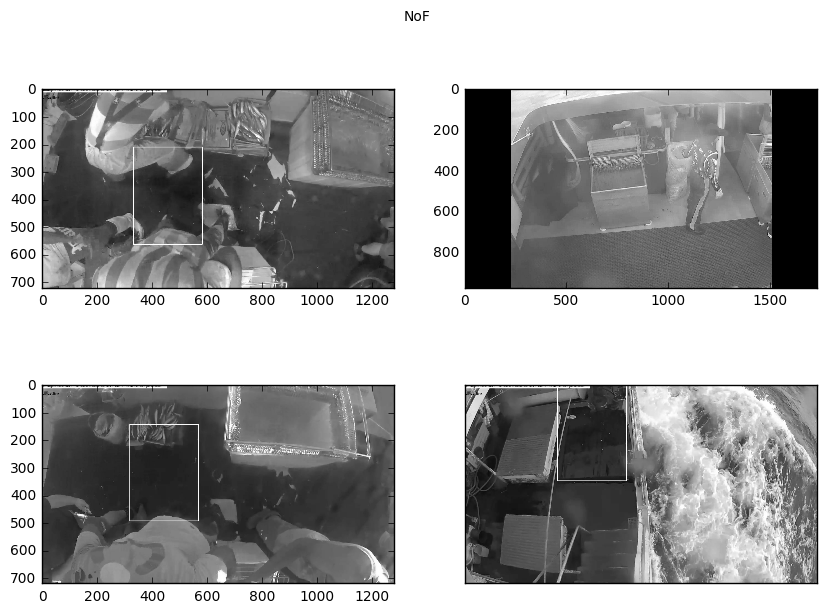

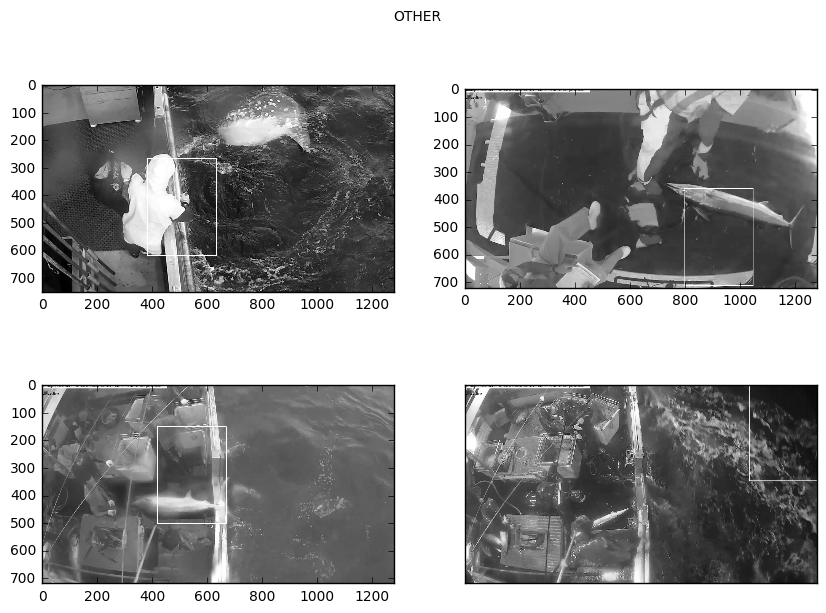

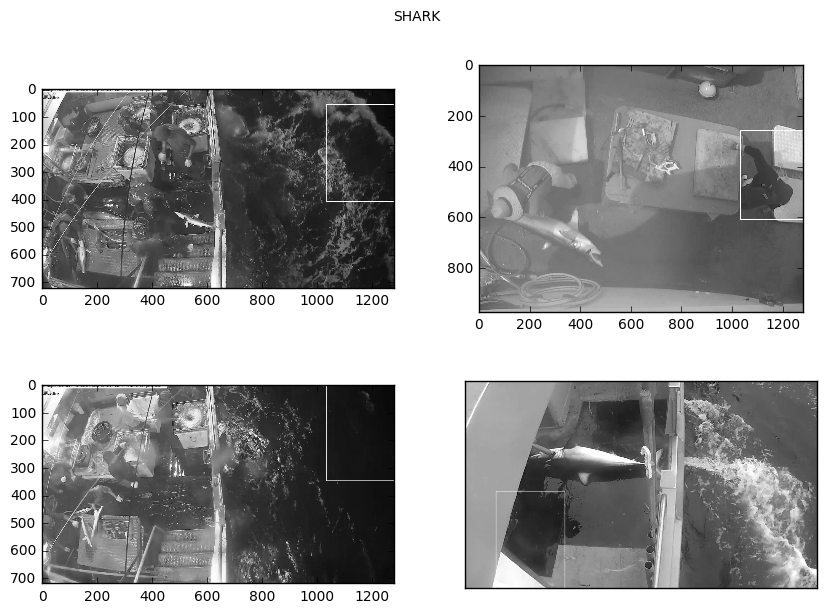

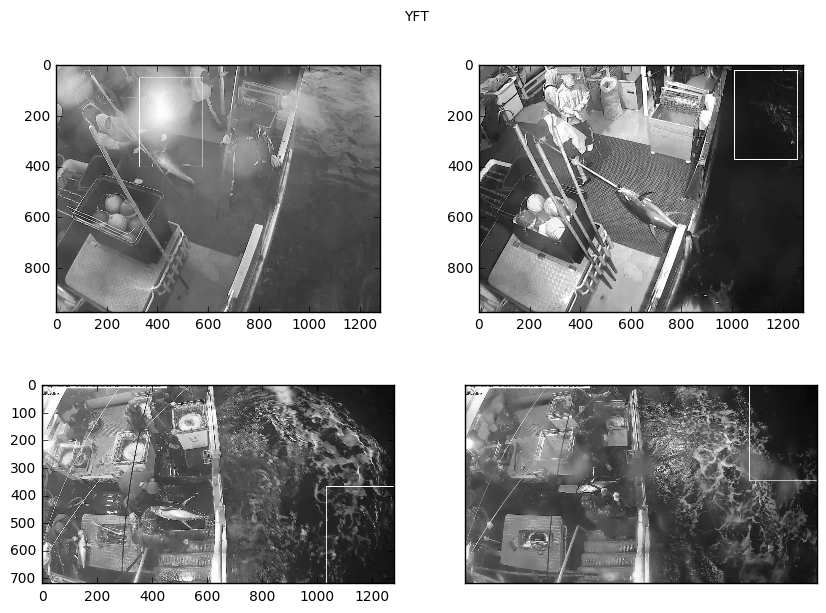

In [15]:
method = eval('cv2.TM_SQDIFF')
indexes=[1,30,40,5]

train_path = "../Data/Kaggle/train/"
sub_folders = check_output(["ls", train_path]).decode("utf8").strip().split('\n')
for sub_folder in sub_folders:
    file_names = check_output(["ls", train_path+sub_folder]).decode("utf8").strip().split('\n')
    k=0
    _, ax = plt.subplots(2,2,figsize=(10, 7))
    for file_name in [file_names[x] for x in indexes]: # I take only 4 images of each group. 
        img = cv2.imread(train_path+sub_folder+"/"+file_name,0)
        img2 = img
        w, h = template.shape[::-1]
        # Apply template Matching
        res = cv2.matchTemplate(img,template,method)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
 
        cv2.rectangle(img,top_left, bottom_right, 255, 2)
        if k==0 : 
            ax[0,0].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        if k==1 : 
            ax[0,1].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        if k==2 : 
            ax[1,0].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        if k==3 : 
            ax[1,1].imshow(img,cmap = 'gray')
            plt.xticks([]), plt.yticks([])
        k=k+1
    plt.suptitle(sub_folder)
    plt.show()



## 1.3 Re-train LAG with SIFT

http://docs.opencv.org/3.1.0/da/df5/tutorial_py_sift_intro.html


(<matplotlib.axes._subplots.AxesSubplot at 0x7f77ca55b150>,
 <matplotlib.image.AxesImage at 0x7f77db124e10>)

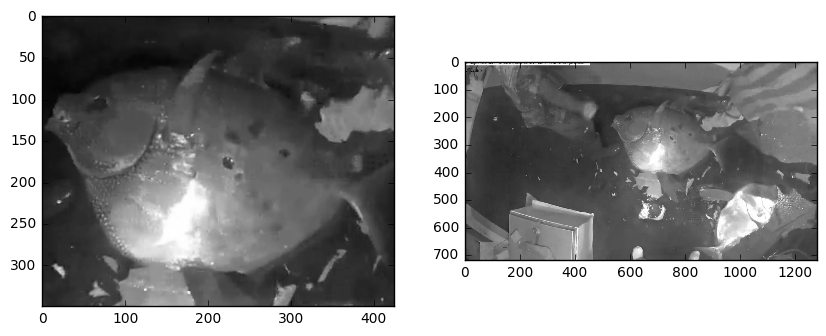

In [16]:
img_rows, img_cols= 350, 425
im_array = cv2.imread('../Data/Kaggle/train/LAG/img_00091.jpg',0)
template = np.zeros([ img_rows, img_cols], dtype='uint8') # initialisation of the template
template[:, :] = im_array[100:450,525:950] # I try multiple times to find the correct rectangle. 
#template /= 255.
plt.subplots(figsize=(10, 7))
plt.subplot(121),plt.imshow(template, cmap='gray') 
plt.subplot(122), plt.imshow(im_array, cmap='gray')

In [3]:
img = cv2.imread('../Data/Kaggle/train/LAG/img_00091.jpg')
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()

kp = sift.detect(gray,None)

img=cv2.drawKeypoints(gray,kp)

cv2.imwrite('sift_keypoints.jpg',img)

img=cv2.drawKeypoints(gray,kp,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

cv2.imwrite('sift_keypoints.jpg',img)

sift = cv2.xfeatures2d.SIFT_create()

kp, des = sift.detectAndCompute(gray,None)

AttributeError: 'module' object has no attribute 'xfeatures2d'

## 1.0 End

In [4]:
count = 0 # count, to test the algorithm with 100 pictures
images = []

for filename in dummy_df.image_name:
    img = cv2.imread(filename) # Read file    
    img = cv2.resize(img, (224, 224)) # Resize image to 224 x 224 pixels (dont feel obliged to use this)
    img = img.astype(np.float32) # Change to 32 bit floats (good for neural networks, other floats not as much making sense)

    # "Normalize" images
    for rgb_value in [0,1,2]:
        img[:, :, rgb_value] = img[:, :, rgb_value] / 255.0 # 255 is the RGB maximum
        img[:, :, rgb_value] -= numpy.mean(img[:, :, rgb_value])

    img = img.transpose((2,0,1))

    images.append(img)

# X and y value and labels
x = np.asarray(images)
y = dummy_df.iloc[:,1:9].as_matrix()
labels = dummy_df.image_name.apply(lambda path: path[-13:])

# table, just to be sure that everything goes well
dummy_df['image_bytes'] = images
dummy_df.head()

NameError: name 'dummy_df' is not defined

In [5]:
# Bad script for test-train. 

split_no = 90

x_train = x[:split_no]
y_train = y[:split_no]
labels_train = labels[:split_no]

x_test = x[split_no:]
y_test = y[split_no:]
labels_test = labels[split_no:]

NameError: name 'x' is not defined

In [6]:
model = Sequential()
model.add(Convolution2D(32, 3, 3, input_shape=(3, 224, 224), border_mode='same', activation='relu', W_constraint=maxnorm(3)))
model.add(Dropout(0.2))
model.add(Convolution2D(32, 3, 3, activation='relu', border_mode='same', W_constraint=maxnorm(3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512, activation='relu', W_constraint=maxnorm(3)))
model.add(Dropout(0.5))
model.add(Dense(8, activation='softmax'))
# Compile model
epochs = 1 # dont leave it like this, only for testing!
lrate = 0.01
decay = lrate/epochs
sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
print(model.summary())

NameError: name 'Sequential' is not defined

In [7]:
# Fit the model
model.fit(x_train, y_train, validation_data=(x_test, y_test), nb_epoch=epochs, batch_size=32)
# Final evaluation of the model
scores = model.evaluate(x_test, y_test, verbose=0)
classes = model.predict_proba(x_test, batch_size=32)

# get probability table
proba_df = pd.DataFrame(classes)
proba_df.columns = image_df.groupby('fish_type').count().index # workaround to get column names quickly and in right order

print("Accuracy: %.2f%%" % (scores[1]*100))
print ' '
proba_df

NameError: name 'model' is not defined

In [ ]:
proba_df['img_names'] = labels_test.values

In [1]:
import PIL
from PIL import Image
from matplotlib import pyplot as plt

im = Image.open('../Data/Kaggle/train/ALB/img_00003.jpg')  
w, h = im.size  
colors = im.getcolors(w*h)

def hexencode(rgb):
    r=rgb[0]
    g=rgb[1]
    b=rgb[2]
    return '#%02x%02x%02x' % (r,g,b)

for idx, c in enumerate(colors):
    plt.bar(idx, c[0], color=hexencode(c[1]))

plt.show()